# Proyek Analisis Data: Bike Sharing Dataset (Sumber [1](https://www.kaggle.com/datasets/lakshmi25npathi/bike-sharing-dataset), [2](https://archive.ics.uci.edu/dataset/275/bike+sharing+dataset))
- Nama: Syahril Dimas Sabirin
- Email: syahrildimassabirin@gmail.com
- Username: [sabirinid](https://www.dicoding.com/users/sabirinid/)

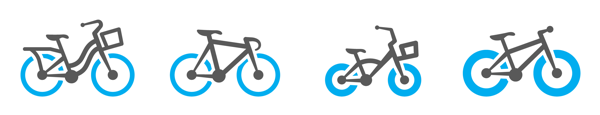

Image by [Kaggle Media](https://storage.googleapis.com/kaggle-media/competitions/kaggle/3948/media/bikes.png)

## Menentukan Pertanyaan Bisnis

- Apakah pola rental sepeda berubah seiring waktu (jam, hari, bulan, tahun) berdasarkan hari kerja atau libur?
- Bagaimanakah pengaruh cuaca (termasuk temperatur dan kelembapan) terhadap jumlah rental sepeda?

## Menyiapkan semua library yang dibutuhkan

In [64]:
# Data manipulation
import numpy as np
import pandas as pd
import datetime as dt
import calendar as c

# Data visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# Access Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Shows plots in jupyter notebook
%matplotlib inline

# Ignore warning
import warnings
warnings.filterwarnings('ignore')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [65]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [66]:
print('NumPy', np.__version__)
print('Pandas', pd.__version__)
print('Matplotlib', mpl.__version__)
print('Seaborn', sns.__version__)

NumPy 1.23.5
Pandas 1.5.3
Matplotlib 3.7.1
Seaborn 0.12.2


## Data Wrangling

### Gathering Data

[Dataset](https://archive.ics.uci.edu/dataset/275/bike+sharing+dataset) ini berisi jumlah rental sepeda per jam dan per hari antara tahun 2011 dan 2012 dalam data sistem [Capital Bikeshare](http://www.capitalbikeshare.com/system-data) termasuk dengan informasi cuaca dan musim.

Kedua data `day.csv` maupun `hour.csv` memiliki kolom yang sama, kecuali kolom `hr` yang tidak tersedia di `day.csv`.

In [67]:
# Load daily data
day = pd.read_csv('/content/drive/MyDrive/Dicoding/Bike-sharing-dataset/day.csv')
df_day = day.copy()
df_day.head().style.background_gradient(cmap='Spectral')

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


In [68]:
# Load hourly data
hour = pd.read_csv('/content/drive/MyDrive/Dicoding/Bike-sharing-dataset/hour.csv')
df_hour = hour.copy()
df_hour.head().style.background_gradient(cmap='Spectral')

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.240000,0.287900,0.810000,0.000000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.220000,0.272700,0.800000,0.000000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.220000,0.272700,0.800000,0.000000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.240000,0.287900,0.750000,0.000000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.240000,0.287900,0.750000,0.000000,0,1,1


### Assessing Data

#### Assess `df_day`

In [69]:
print(f'Tabel "df_day" terdiri dari:\n- {df_day.shape[0]} baris\n- {df_day.shape[1]} kolom.')

Tabel "df_day" terdiri dari:
- 731 baris
- 16 kolom.


In [70]:
# Check details of the DataFrame
df_day.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     731 non-null    int64  
 1   dteday      731 non-null    object 
 2   season      731 non-null    int64  
 3   yr          731 non-null    int64  
 4   mnth        731 non-null    int64  
 5   holiday     731 non-null    int64  
 6   weekday     731 non-null    int64  
 7   workingday  731 non-null    int64  
 8   weathersit  731 non-null    int64  
 9   temp        731 non-null    float64
 10  atemp       731 non-null    float64
 11  hum         731 non-null    float64
 12  windspeed   731 non-null    float64
 13  casual      731 non-null    int64  
 14  registered  731 non-null    int64  
 15  cnt         731 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.5+ KB


In [71]:
# Detect missing values
print(f'Jumlah missing values   : {df_day.isnull().sum().sum()}')

# Detect duplicated values
print(f'Jumlah duplicated values: {df_day.duplicated().sum()}')

Jumlah missing values   : 0
Jumlah duplicated values: 0


In [72]:
# Statistics for the columns (features)
df_day.describe(include='all')

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,731.000000,731,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
unique,NaN,731,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,2011-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,366.000000,NaN,2.496580,0.500684,6.519836,0.028728,2.997264,0.683995,1.395349,0.495385,0.474354,0.627894,0.190486,848.176471,3656.172367,4504.348837
std,211.165812,NaN,1.110807,0.500342,3.451913,0.167155,2.004787,0.465233,0.544894,0.183051,0.162961,0.142429,0.077498,686.622488,1560.256377,1937.211452
min,1.000000,NaN,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.059130,0.079070,0.000000,0.022392,2.000000,20.000000,22.000000
25%,183.500000,NaN,2.000000,0.000000,4.000000,0.000000,1.000000,0.000000,1.000000,0.337083,0.337842,0.520000,0.134950,315.500000,2497.000000,3152.000000
50%,366.000000,NaN,3.000000,1.000000,7.000000,0.000000,3.000000,1.000000,1.000000,0.498333,0.486733,0.626667,0.180975,713.000000,3662.000000,4548.000000
75%,548.500000,NaN,3.000000,1.000000,10.000000,0.000000,5.000000,1.000000,2.000000,0.655417,0.608602,0.730209,0.233214,1096.000000,4776.500000,5956.000000


**Hasil Observasi**

- Tidak ada nilai yang hilang (*missing values*) dan duplikat dalam data.
- Kolom `instant` merupakan *record index*, sehingga kolom ini bisa dihapus.
- Kolom `dteday` adalah kolom tanggal dengan setiap tanggal unik dan seharusnya memiliki tipe data `datetime`.
- Kolom `yr` memiliki dua nilai unik yang mungkin menunjukkan dua tahun data.
- Kolom `mnth` menunjukkan bulan dalam satu tahun dengan nilai minimum 1 dan maksimum 12, yaitu dari bulan Januari hingga Desember.
- Kolom `season`, `holiday`, `weekday`, `workingday`, dan `weathersit` yang mungkin berisi data kategorikal.
- Kolom `temp`, `atemp`, `hum`, dan `windspeed` merupakan data kontinu yang berkaitan dengan kondisi cuaca.
- Kolom `casual`, `registered`, dan `cnt` menunjukkan jumlah pengguna sepeda, yaitu `casual` dan `registered` masing-masing adalah pengguna sepeda **non-terdaftar** dan **terdaftar**, sementara `cnt` adalah total pengguna sepeda.

#### Assess `df_hour`

In [73]:
print(f'Tabel "df_hour" terdiri dari:\n- {df_hour.shape[0]} baris\n- {df_hour.shape[1]} kolom.')

Tabel "df_hour" terdiri dari:
- 17379 baris
- 17 kolom.


In [74]:
df_hour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


In [75]:
print(f'Jumlah missing values   : {df_hour.isnull().sum().sum()}')
print(f'Jumlah duplicated values: {df_hour.duplicated().sum()}')

Jumlah missing values   : 0
Jumlah duplicated values: 0


In [76]:
df_hour.describe(include='all')

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,17379.0000,17379,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
unique,NaN,731,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,2011-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,8690.0000,NaN,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,5017.0295,NaN,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.0000,NaN,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4345.5000,NaN,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,8690.0000,NaN,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,13034.5000,NaN,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000


**Hasil Observasi**

- Tidak ada nilai yang hilang (*missing values*) dan duplikat dalam data.
- Kolom `hour` menunjukkan jam dalam satu hari dengan nilai minimum 0 dan maksimum 23, yaitu dari pukul 00.00 (pagi) hingga 23.00 (malam).
- Pada tahap berikutnya, hanya akan digunakan `df_hour` untuk analisis lebih lanjut.

### Cleaning Data

Pada tahap *data cleaning*, dilakukan *handling ouliers* terlebih dahulu pada kolom `cnt`.

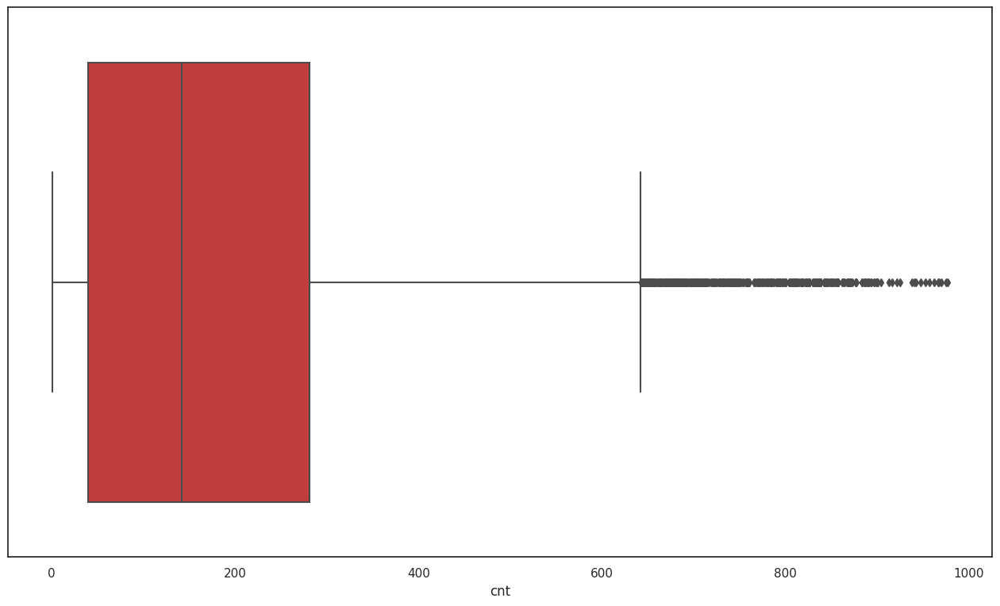

In [77]:
plt.figure(figsize=(16, 9))
sns.boxplot(x=df_hour['cnt'], color='tab:red')
plt.show()

In [78]:
# Check ouliers
Q1 = df_hour['cnt'].quantile(0.25)
Q3 = df_hour['cnt'].quantile(0.75)
IQR = Q3 - Q1

# Define bounds for the outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify the outliers
outliers = df_hour[(df_hour['cnt'] < lower_bound) | (df_hour['cnt'] > upper_bound)]
outliers.style.background_gradient(cmap='Spectral')

In [79]:
print(f'Jumlah outliers: {len(outliers)}')

Jumlah outliers: 505


In [80]:
print(f'Dimensi data sebelum removing outliers: {df_hour.shape}')

# Remove outliers
df_hour = df_hour[(df_hour['cnt'] >= lower_bound) & (df_hour['cnt'] <= upper_bound)]

print(f'Dimensi data sesudah removing outliers: {df_hour.shape}')

Dimensi data sebelum removing outliers: (17379, 17)
Dimensi data sesudah removing outliers: (16874, 17)


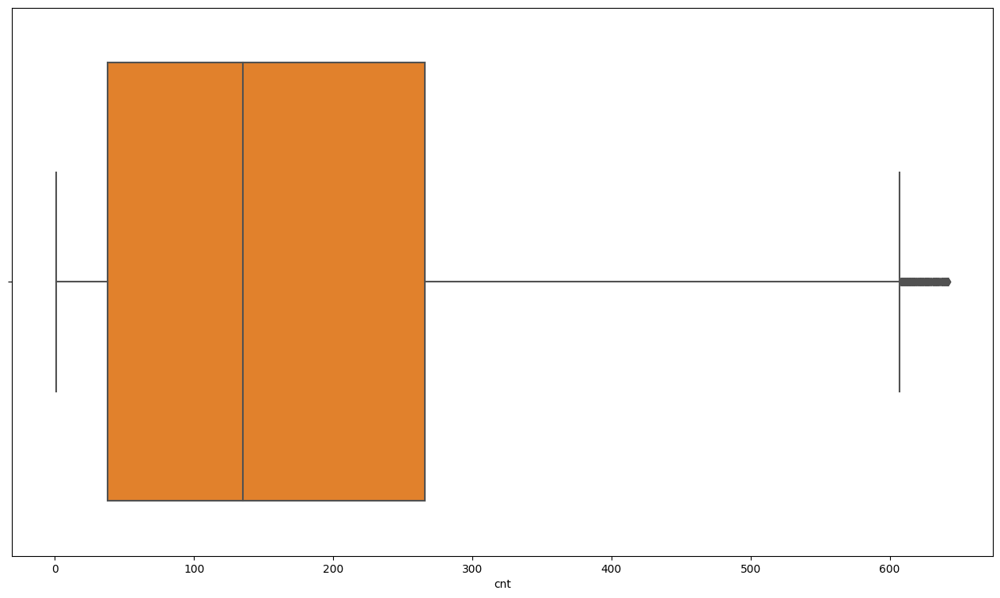

In [18]:
plt.figure(figsize=(16, 9))
sns.boxplot(x=df_hour['cnt'], color='tab:orange')
plt.show()

Selanjutnya, pada tahap ini, dilakukan *renaming columns* dan *mapping categories* untuk menghindari ketidakjelasan atau ambiguitas, dan tidak dilakukan *handling missing values* dan *duplicated values*, karena data sudah bersih.

In [81]:
# Rename the columns
column_names = {
    'instant': 'index',
    'dteday': 'date',
    'season': 'season',
    'yr': 'year',
    'mnth': 'month',
    'hr': 'hour',
    'holiday': 'holiday',              # whether the day is considered a holiday
    'weekday': 'weekday',              # day of the week
    'workingday': 'workingday',        # whether the day is neither a weekend nor holiday
    'weathersit': 'weather_situation',
    'temp': 'temperature',             # normalized temperature in Celsius
    'atemp': 'feels_like_temperature', # normalized feeling temperature in Celsius
    'hum': 'humidity',                 # relative humidity
    'windspeed': 'wind_speed',
    'casual': 'non_registered_user_rentals',
    'registered': 'registered_user_rentals',
    'cnt': 'total_rentals',
}

df_hour = df_hour.rename(columns=column_names)

Kemudian, dilakukan *dropping unnecessary column*, yaitu kolom `index`.

In [82]:
# Drop 'index' column
df_hour.drop('index', axis=1, inplace=True)

Lalu, dilanjutkan dengan memperbaiki tipe data `date` menjadi `datetime` dan mengekstrak tahun, `year`, bulan, `month`, serta pekan, `weekday`. Hal ini dilakukan agar data tahun dan bulan memiliki nilai yang valid.

In [83]:
# Convert 'date' to datetime
df_hour['date'] = pd.to_datetime(df_hour['date'])

# Extract 'year' from 'date'
df_hour['year'] = df_hour['date'].dt.year

# Extract 'month' from 'date'
df_hour['month'] = df_hour['date'].dt.strftime('%b')

In [84]:
# Extract 'weekday' from 'date'
df_hour['weekday'] = df_hour['date'].dt.weekday
df_hour['weekday'] = df_hour['weekday'].apply(lambda x: c.day_name[x])

Selanjutnya, dilakukan *mapping categories* pada kolom `season` dan `weather_situation`.

In [85]:
# Map 'holiday' and 'workingday' values
df_hour['holiday'] = df_hour['holiday'].replace({0: 'No', 1: 'Yes'})
df_hour['workingday'] = df_hour['workingday'].replace({0: 'No', 1: 'Yes'})

In [86]:
# Define mapping dictionaries
# weekday_mapping = {
#     0: 'Sun',
#     1: 'Mon',
#     2: 'Tue',
#     3: 'Wed',
#     4: 'Thu',
#     5: 'Fri',
#     6: 'Sat'
#     }
season_mapping = {
    1: 'Winter',
    2: 'Spring',
    3: 'Summer',
    4: 'Autumn'
    }
weather_mapping = {
    1: 'Clear/Partly Cloudy',
    2: 'Misty',
    3: 'Light Rain/Snow',
    4: 'Heavy Rain/Snow'
    }

# Apply the mapping to the columns
# df_hour['weekday'] = df_hour['weekday'].map(weekday_mapping)
df_hour['season'] = df_hour['season'].map(season_mapping)
df_hour['weather_situation'] = df_hour['weather_situation'].map(weather_mapping)

Referensi: https://archive.ics.uci.edu/dataset/275/bike+sharing+dataset

Terakhir, dilakukan pengecekan ulang terhadap kesesuaian setiap nama kolom dan tipe data.

In [87]:
df_hour.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16874 entries, 0 to 17378
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   date                         16874 non-null  datetime64[ns]
 1   season                       16874 non-null  object        
 2   year                         16874 non-null  int64         
 3   month                        16874 non-null  object        
 4   hour                         16874 non-null  int64         
 5   holiday                      16874 non-null  object        
 6   weekday                      16874 non-null  object        
 7   workingday                   16874 non-null  object        
 8   weather_situation            16874 non-null  object        
 9   temperature                  16874 non-null  float64       
 10  feels_like_temperature       16874 non-null  float64       
 11  humidity                     16874 non-nu

In [26]:
df_hour.head().style.background_gradient(cmap='Spectral')

,date,season,year,month,hour,holiday,weekday,workingday,weather_situation,temperature,feels_like_temperature,humidity,wind_speed,non_registered_user_rentals,registered_user_rentals,total_rentals
0,2011-01-01 00:00:00,Winter,2011,Jan,0,No,Saturday,No,Clear/Partly Cloudy,0.240000,0.287900,0.810000,0.000000,3,13,16
1,2011-01-01 00:00:00,Winter,2011,Jan,1,No,Saturday,No,Clear/Partly Cloudy,0.220000,0.272700,0.800000,0.000000,8,32,40
2,2011-01-01 00:00:00,Winter,2011,Jan,2,No,Saturday,No,Clear/Partly Cloudy,0.220000,0.272700,0.800000,0.000000,5,27,32
3,2011-01-01 00:00:00,Winter,2011,Jan,3,No,Saturday,No,Clear/Partly Cloudy,0.240000,0.287900,0.750000,0.000000,3,10,13
4,2011-01-01 00:00:00,Winter,2011,Jan,4,No,Saturday,No,Clear/Partly Cloudy,0.240000,0.287900,0.750000,0.000000,0,1,1


### Exporting Data

Kita akan mengekspor data ke dalam format CSV, dengan nama `main_data.csv`, untuk digunakan ke tahap pengembangan *dashboard*.

In [88]:
# Save to CSV
df_hour.to_csv('/content/drive/MyDrive/Dicoding/Bike-sharing-dataset/main_data.csv', index=False)

## Exploratory Data Analysis (EDA)

### Explore `df_hour`

In [28]:
df_hour.sample(n=5).style.background_gradient(cmap='Spectral')

,date,season,year,month,hour,holiday,weekday,workingday,weather_situation,temperature,feels_like_temperature,humidity,wind_speed,non_registered_user_rentals,registered_user_rentals,total_rentals
9318,2012-01-29 00:00:00,Winter,2012,Jan,4,No,Sunday,No,Clear/Partly Cloudy,0.240000,0.257600,0.300000,0.000000,0,5,5
2355,2011-04-13 00:00:00,Spring,2011,Apr,1,No,Wednesday,Yes,Misty,0.400000,0.409100,1.000000,0.298500,0,1,1
15065,2012-09-24 00:00:00,Autumn,2012,Sep,22,No,Monday,Yes,Clear/Partly Cloudy,0.500000,0.484800,0.510000,0.223900,18,154,172
11606,2012-05-03 00:00:00,Spring,2012,May,19,No,Thursday,Yes,Clear/Partly Cloudy,0.700000,0.651500,0.610000,0.194000,55,467,522
11230,2012-04-18 00:00:00,Spring,2012,Apr,3,No,Wednesday,Yes,Misty,0.500000,0.484800,0.420000,0.223900,0,6,6


Sebelum kita melakukan tahap *Exploratory Data Analysis*, terlebih dahulu kita mendefinisikan data numerikal dan kategorikal, masing-masing sebagai `num_features` dan `cat_features`.

In [89]:
# Define features
num_features = df_hour.select_dtypes(exclude=['object', 'datetime']) # Numerical data
cat_features = df_hour.select_dtypes(include=['object'])             # Categorical data

df_num = num_features.columns
df_cat = cat_features.columns

print(f'Kolom numerikal  : {df_num}\n')
print(f'Kolom kategorikal: {df_cat}')

Kolom numerikal  : Index(['year', 'hour', 'temperature', 'feels_like_temperature', 'humidity',
       'wind_speed', 'non_registered_user_rentals', 'registered_user_rentals',
       'total_rentals'],
      dtype='object')

Kolom kategorikal: Index(['season', 'month', 'holiday', 'weekday', 'workingday',
       'weather_situation'],
      dtype='object')


In [30]:
# Summary statistics for numerical features
num_features.describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.95]).T

,count,mean,std,min,25%,50%,75%,90%,95%,max
year,16874.0,2011.487733,0.499864,2011.00,2011.0000,2011.0000,2012.0000,2012.0000,2012.0000,2012.0000
hour,16874.0,11.458101,6.962144,0.00,5.0000,11.0000,18.0000,21.0000,22.0000,23.0000
temperature,16874.0,0.492650,0.192455,0.02,0.3400,0.5000,0.6400,0.7400,0.8000,1.0000
feels_like_temperature,16874.0,0.471970,0.171878,0.00,0.3333,0.4848,0.6212,0.6818,0.7424,1.0000
humidity,16874.0,0.630412,0.192600,0.00,0.4800,0.6300,0.7900,0.8800,0.9300,1.0000
wind_speed,16874.0,0.189619,0.122460,0.00,0.1045,0.1791,0.2537,0.3582,0.4179,0.8507
non_registered_user_rentals,16874.0,33.418632,45.896591,0.00,4.0000,15.0000,45.0000,86.0000,131.0000,354.0000
registered_user_rentals,16874.0,139.291514,126.052802,0.00,32.0000,111.0000,208.0000,319.0000,397.0000,629.0000
total_rentals,16874.0,172.710146,155.020918,1.00,38.0000,135.0000,265.7500,407.0000,493.0000,642.0000


In [31]:
num_features.describe().loc[['mean', '50%']].T

,mean,50%
year,2011.487733,2011.0000
hour,11.458101,11.0000
temperature,0.492650,0.5000
feels_like_temperature,0.471970,0.4848
humidity,0.630412,0.6300
wind_speed,0.189619,0.1791
non_registered_user_rentals,33.418632,15.0000
registered_user_rentals,139.291514,111.0000
total_rentals,172.710146,135.0000


**Hasil Observasi**

- Kolom `temperature`, `feels_like_temperature`, dan `humidity` cenderung memiliki distribusi normal.
- Kolom `wind_speed`, `non_registered_user_rentals`, `registered_user_rentals`, dan `total_rentals` cenderung memiliki distribusi *right skewed* (*positive skewness*), karena nilai mean > median.
- Kolom `non_registered_user_rentals`, `registered_user_rentals`, dan `total_rentals` memiliki nilai ekstrem atau *outliers*.

In [32]:
# Summary statistics for categorical features
cat_features.describe().T

,count,unique,top,freq
season,16874,4,Summer,4298
month,16874,12,Dec,1470
holiday,16874,2,No,16376
weekday,16874,7,Sunday,2474
workingday,16874,2,Yes,11451
weather_situation,16874,4,Clear/Partly Cloudy,11020


In [90]:
print('Persentase per kategori:\n')
# Count values
for col in cat_features:
    print(f'Kolom {col}:')
    print(cat_features[col].value_counts(normalize=True).round(4))
    print()

Persentase per kategori:

Kolom season:
Summer    0.2547
Spring    0.2520
Winter    0.2503
Autumn    0.2430
Name: season, dtype: float64

Kolom month:
Dec    0.0871
May    0.0855
Mar    0.0852
Jul    0.0850
Jan    0.0847
Nov    0.0839
Aug    0.0833
Apr    0.0826
Oct    0.0820
Jun    0.0817
Sep    0.0796
Feb    0.0795
Name: month, dtype: float64

Kolom holiday:
No     0.9705
Yes    0.0295
Name: holiday, dtype: float64

Kolom weekday:
Sunday       0.1466
Saturday     0.1453
Friday       0.1434
Monday       0.1427
Wednesday    0.1410
Thursday     0.1408
Tuesday      0.1403
Name: weekday, dtype: float64

Kolom workingday:
Yes    0.6786
No     0.3214
Name: workingday, dtype: float64

Kolom weather_situation:
Clear/Partly Cloudy    0.6531
Misty                  0.2634
Light Rain/Snow        0.0834
Heavy Rain/Snow        0.0002
Name: weather_situation, dtype: float64



In [91]:
# Define get_unique_values() function
def get_unique_values(df):
    # Calculate the number of unique values
    uniques = df.nunique().sort_values()
    # Create a dictionary to store the results
    values = {
        'Feature Name' : [],
        'N'            : [],
        'Unique Values': []
    }
    # Iterate over the unique values in each column
    for col in uniques.index:
        values['Feature Name'].append(col)
        values['N'].append(df[col].nunique())
        values['Unique Values'].append(df[col].unique())
    # Convert the dictionary to a DataFrame
    values = pd.DataFrame(values)

    return values

In [35]:
get_unique_values(cat_features).style.background_gradient(cmap='Spectral')

,Feature Name,N,Unique Values
0,holiday,2,['No' 'Yes']
1,workingday,2,['No' 'Yes']
2,season,4,['Winter' 'Spring' 'Summer' 'Autumn']
3,weather_situation,4,['Clear/Partly Cloudy' 'Misty' 'Light Rain/Snow' 'Heavy Rain/Snow']
4,weekday,7,['Saturday' 'Sunday' 'Monday' 'Tuesday' 'Wednesday' 'Thursday' 'Friday']
5,month,12,['Jan' 'Feb' 'Mar' 'Apr' 'May' 'Jun' 'Jul' 'Aug' 'Sep' 'Oct' 'Nov' 'Dec']


In [36]:
# Retrieve the count and frequency values
count = cat_features.describe().loc['count']
top_freq = cat_features.describe().loc['freq']

# Calculate the percentage of top_freq
percentage = (top_freq / count) * 100
percentage = percentage.astype(float)

# Combine the results
result = pd.concat([cat_features.describe().loc['top'], percentage], axis=1)
result.columns = ['Top most frequent value', 'Percentage (%)']
result.round(2).reset_index().rename(columns={'index': 'Feature Name'}).style.background_gradient(cmap='Spectral')

,Feature Name,Top most frequent value,Percentage (%)
0,season,Summer,25.470000
1,month,Dec,8.710000
2,holiday,No,97.050000
3,weekday,Sunday,14.660000
4,workingday,Yes,67.860000
5,weather_situation,Clear/Partly Cloudy,65.310000


**Hasil Observasi**

- Mayoritas rental sepeda terjadi pada musim panas (`Summer`), bulan `December`, dan pada hari-hari kerja.
- Meskipun demikian, rental sepeda pada hari Ahad/Minggu/`Sunday` dan cuaca cerah cenderung paling tinggi.

## Data Visualization & Explanatory Analysis

Pada tahap ini, kita akan melakukan *univariate*, *bivariate*, dan *multivariate analysis*.

### Univariate Analysis

#### Numerical features

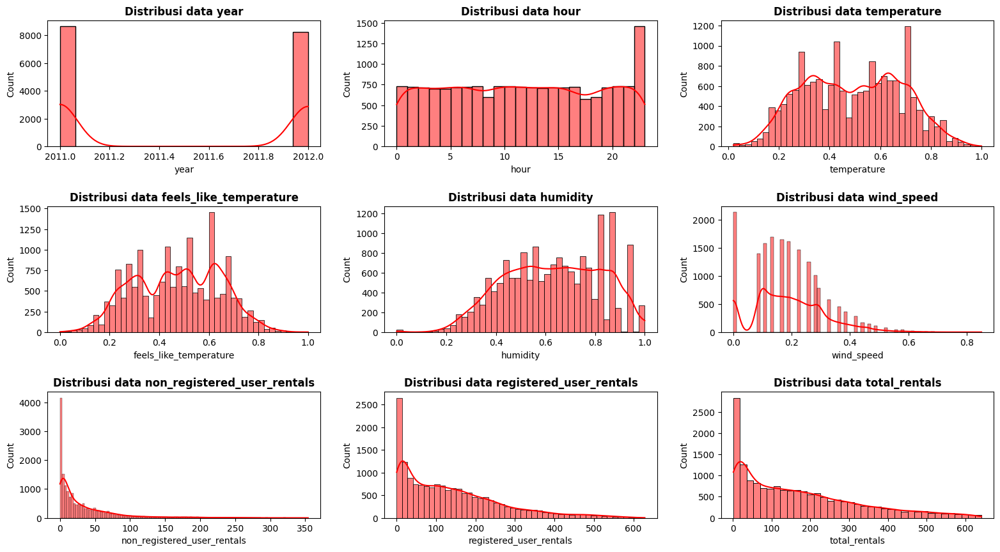

In [37]:
plt.figure(figsize=(16, 9))
for i in range(0, len(df_num)):
    plt.subplot(3, 3, i + 1)
    sns.histplot(x=df_hour[df_num[i]], kde=True, color='red')
    plt.xlabel(df_num[i])
    plt.title(f'Distribusi data {df_num[i]}',
              fontsize=12,
              fontweight='bold')

plt.tight_layout(pad=2)
plt.show()

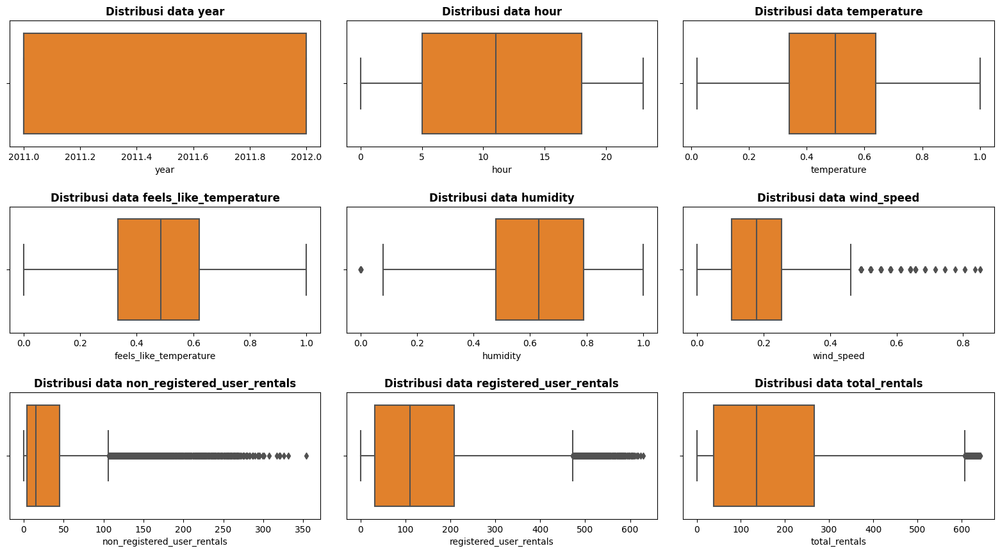

In [38]:
plt.figure(figsize=(16, 9))
for i in range(0, len(df_num)):
    plt.subplot(3, 3, i + 1)
    sns.boxplot(x=df_hour[df_num[i]], color='tab:orange')
    plt.xlabel(df_num[i])
    plt.title(f'Distribusi data {df_num[i]}',
              fontsize=12,
              fontweight='bold')

plt.tight_layout(pad=2)
plt.show()

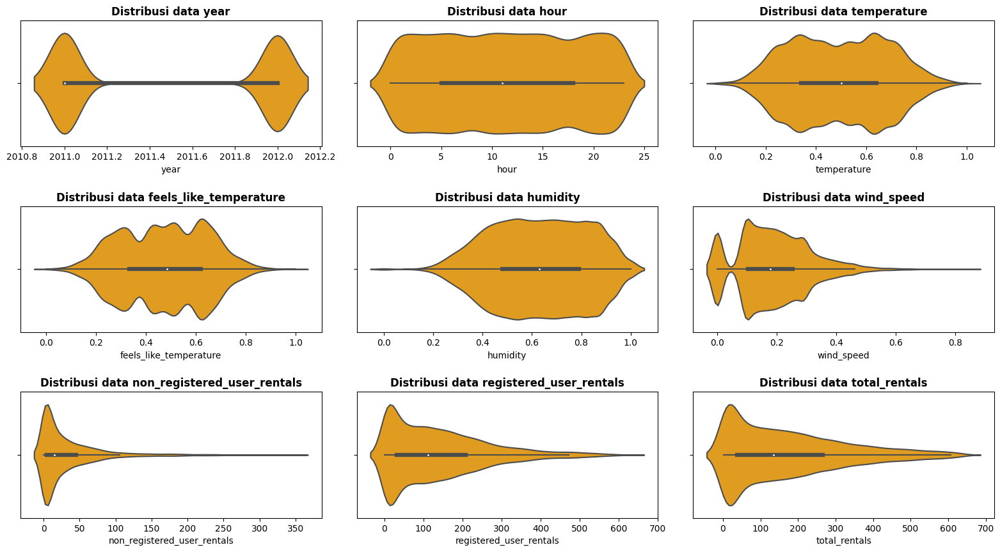

In [39]:
plt.figure(figsize=(16, 9))
for i in range(0, len(df_num)):
    plt.subplot(3, 3, i + 1)
    sns.violinplot(x=df_hour[df_num[i]], color='orange')
    plt.xlabel(df_num[i])
    plt.title(f'Distribusi data {df_num[i]}',
              fontsize=12,
              fontweight='bold')

plt.tight_layout(pad=2)
plt.show()

#### Categorical features

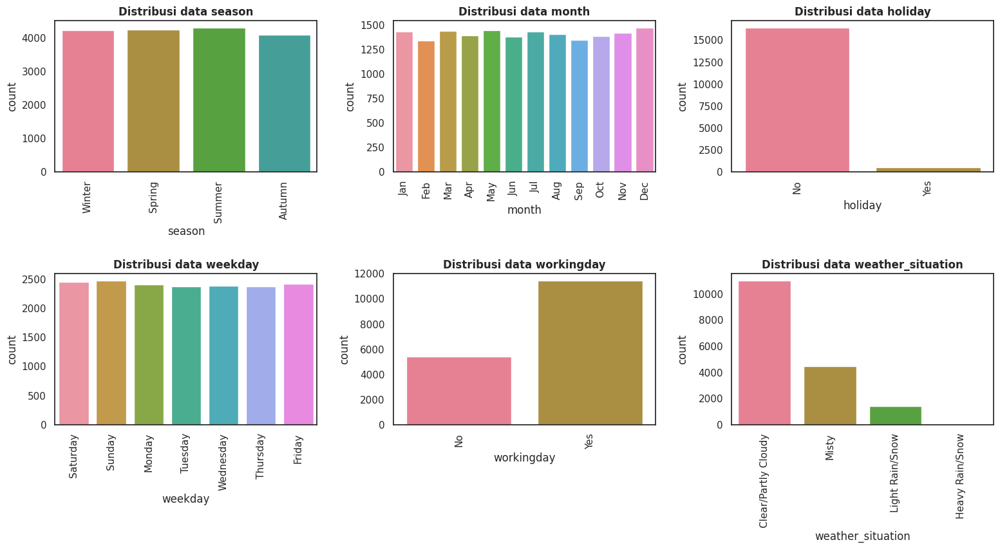

In [40]:
plt.figure(figsize=(16, 9))
for i in range(0, len(df_cat)):
    sns.set(style='white', palette='husl')
    plt.subplot(2, 3, i + 1)
    sns.countplot(x=df_hour[df_cat[i]])
    plt.xlabel(df_cat[i])
    plt.xticks(rotation=90)
    plt.title(f'Distribusi data {df_cat[i]}',
              fontsize=12,
              fontweight='bold')

plt.tight_layout(pad=2)
plt.show()

### Bivariate Analysis

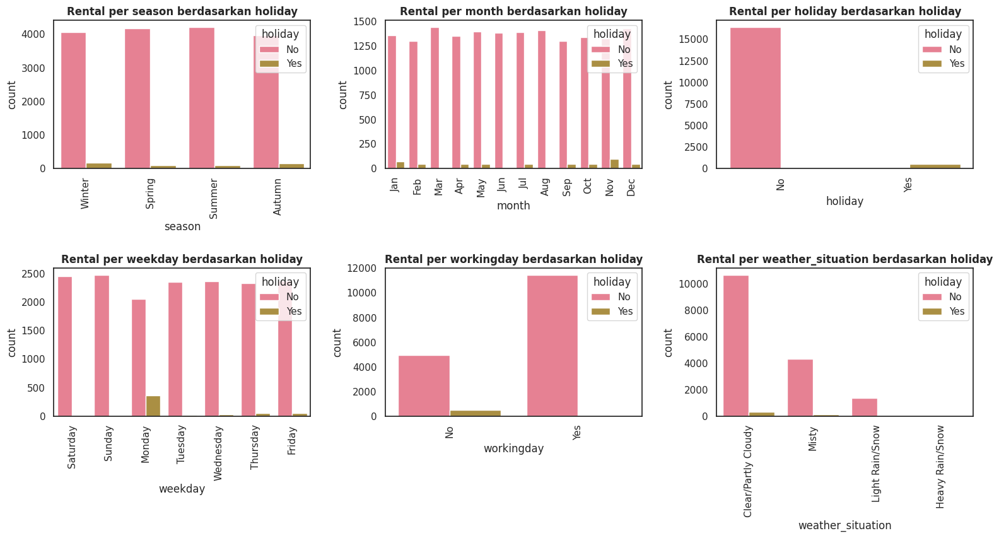

In [41]:
plt.figure(figsize=(16, 9))
for i in range(0, len(df_cat)):
    sns.set(style='white', palette='husl')
    plt.subplot(2, 3, i + 1)
    sns.countplot(x=df_hour[df_cat[i]],
                  hue=df_hour['holiday'])
    plt.xlabel(df_cat[i])
    plt.xticks(rotation=90)
    plt.title(f'Rental per {df_cat[i]} berdasarkan holiday',
              fontsize=12,
              fontweight='bold')

plt.tight_layout(pad=2)
plt.show()

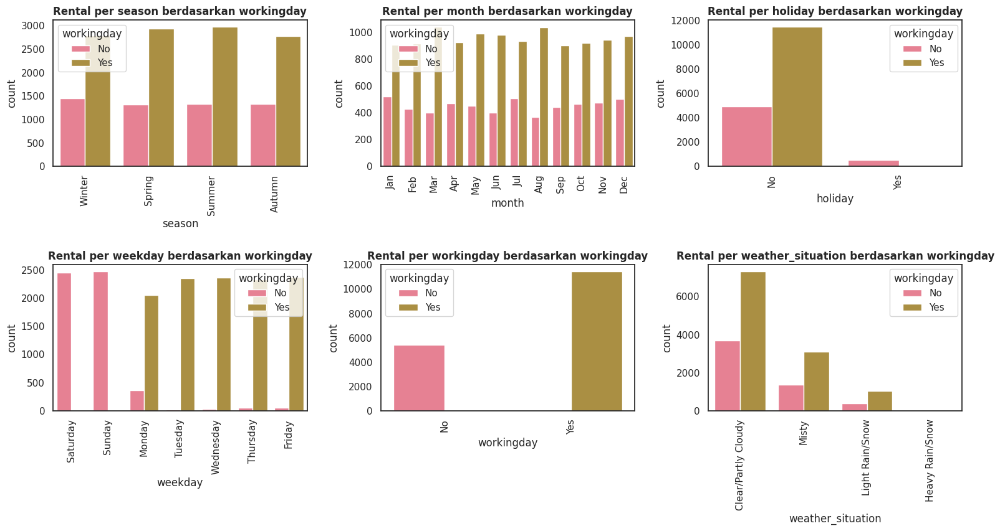

In [42]:
plt.figure(figsize=(16, 9))
for i in range(0, len(df_cat)):
    sns.set(style='white', palette='husl')
    plt.subplot(2, 3, i + 1)
    sns.countplot(x=df_hour[df_cat[i]],
                  hue=df_hour['workingday'])
    plt.xlabel(df_cat[i])
    plt.xticks(rotation=90)
    plt.title(f'Rental per {df_cat[i]} berdasarkan workingday',
              fontsize=12,
              fontweight='bold')

plt.tight_layout(pad=2)
plt.show()

### Multivariate Analysis

<Figure size 900x900 with 0 Axes>

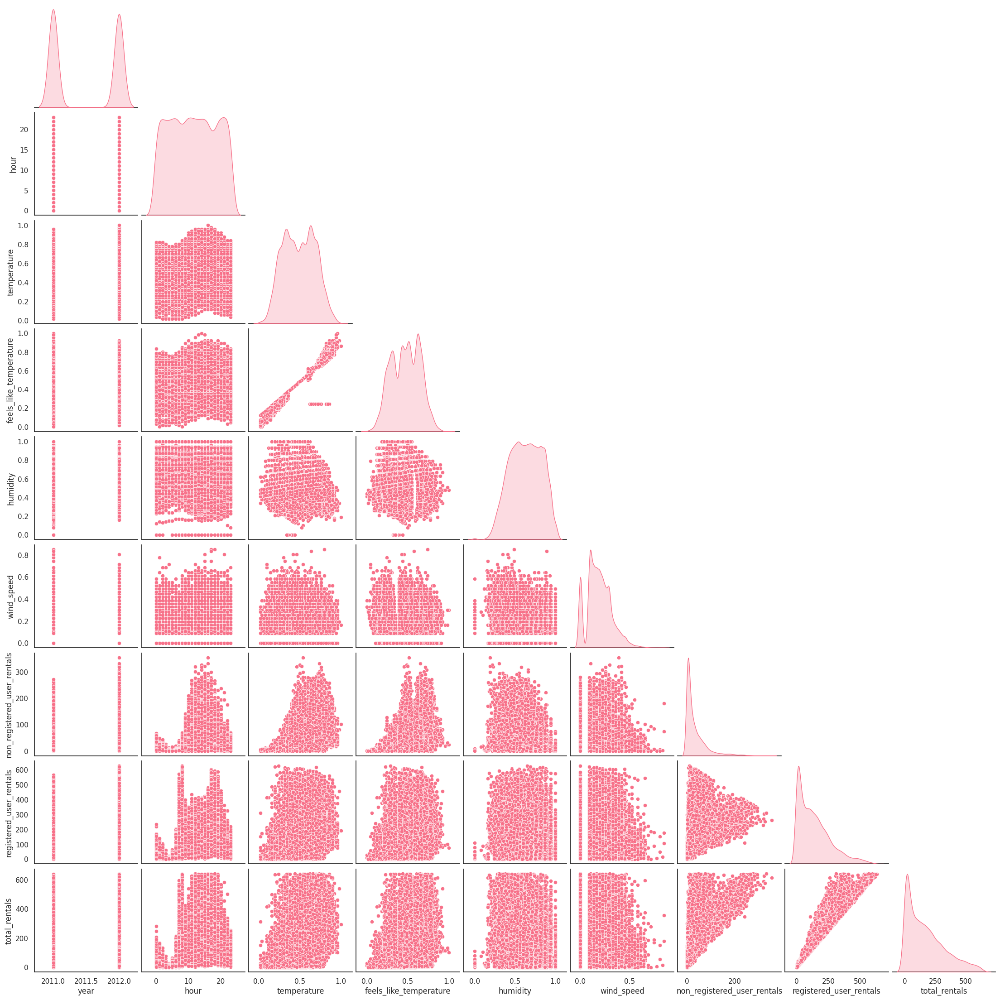

In [43]:
plt.figure(figsize=(9, 9))
sns.pairplot(df_hour,
             diag_kind='kde',
             palette='Paired',
             corner=True)
plt.show()

In [44]:
# Correlations for the different numerical features
corrs = df_hour.corr()
corrs.reset_index().rename(columns = {'index': 'Feature Name'}).style.background_gradient(cmap='Spectral')

,Feature Name,year,hour,temperature,feels_like_temperature,humidity,wind_speed,non_registered_user_rentals,registered_user_rentals,total_rentals
0,year,1.000000,-0.016965,0.019214,0.017834,-0.069480,-0.013099,0.107898,0.196290,0.191555
1,hour,-0.016965,1.000000,0.125710,0.122299,-0.268034,0.134358,0.301216,0.407894,0.420853
2,temperature,0.019214,0.125710,1.000000,0.988276,-0.054769,-0.028585,0.464094,0.324886,0.401579
3,feels_like_temperature,0.017834,0.122299,0.988276,1.000000,-0.037332,-0.068713,0.457770,0.323193,0.398330
4,humidity,-0.069480,-0.268034,-0.054769,-0.037332,1.000000,-0.288888,-0.333396,-0.280723,-0.326973
5,wind_speed,-0.013099,0.134358,-0.028585,-0.068713,-0.288888,1.000000,0.084921,0.089356,0.097801
6,non_registered_user_rentals,0.107898,0.301216,0.464094,0.457770,-0.333396,0.084921,1.000000,0.521631,0.720223
7,registered_user_rentals,0.196290,0.407894,0.324886,0.323193,-0.280723,0.089356,0.521631,1.000000,0.967572
8,total_rentals,0.191555,0.420853,0.401579,0.398330,-0.326973,0.097801,0.720223,0.967572,1.000000


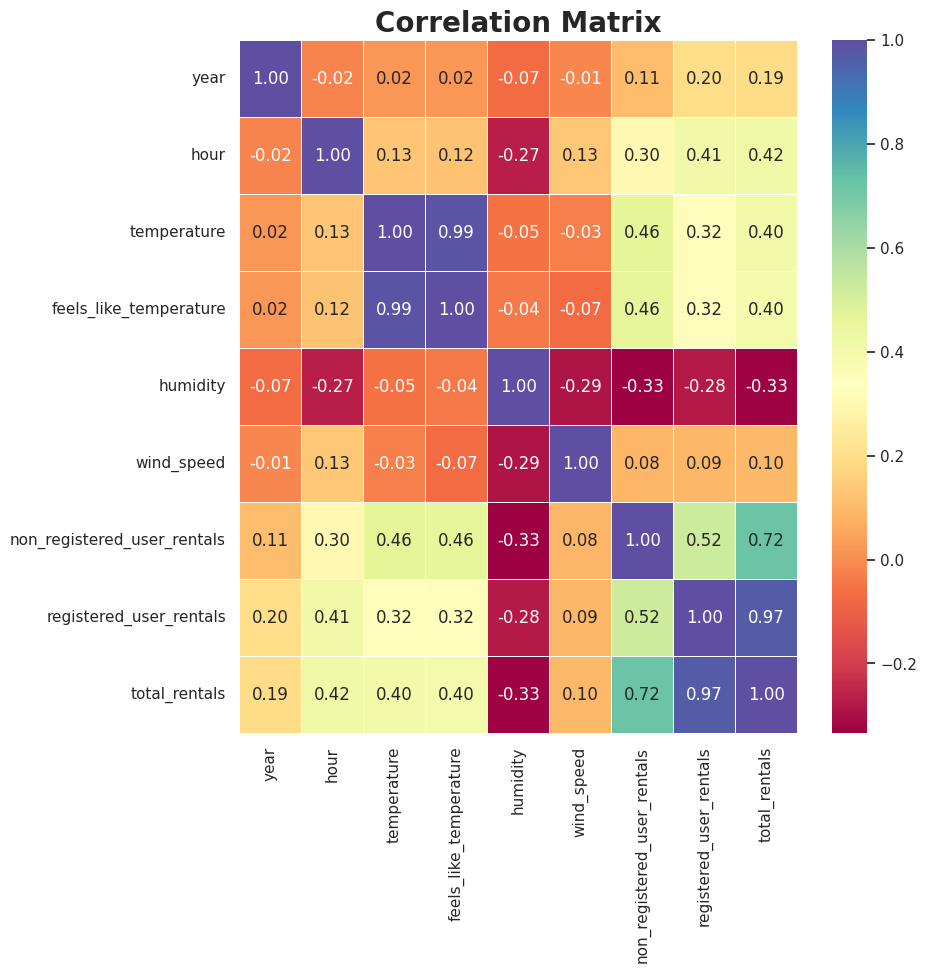

In [45]:
plt.figure(figsize=(9, 9))
sns.heatmap(data=corrs,
            cmap='Spectral',
            annot=True,
            fmt='.2f',
            linewidths=0.5)
plt.title(label='Correlation Matrix',
          fontsize=20,
          fontweight='bold')
plt.show()

**Hasil Observasi**

- Kolom `non_registered_user_rentals` dan `registered_user_rentals` memiliki korelasi positif yang sangat kuat terhadap `total_rentals`, masing-masing dengan skor 0,72 dan 0,97.
- Kolom `year` dan `wind_speed` memiliki korelasi positif yang sangat lemah, masing-masing dengan skor 0,19 dan 0,10.

### Jawaban dari Pertanyaan 1: Apakah pola rental sepeda berubah seiring waktu (jam, hari, bulan, tahun) berdasarkan hari kerja atau libur?

In [46]:
features = ['hour', 'weekday', 'month', 'year']

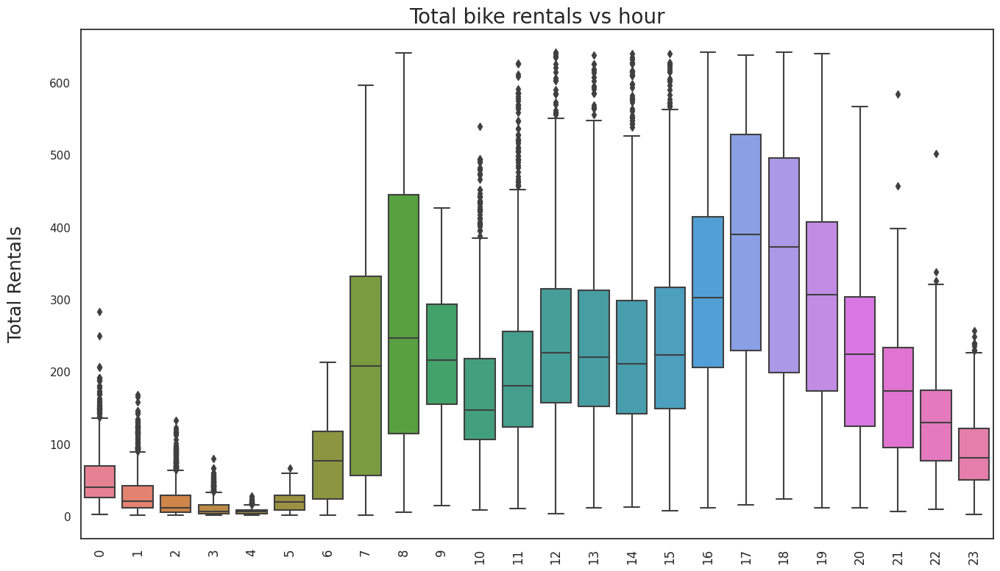

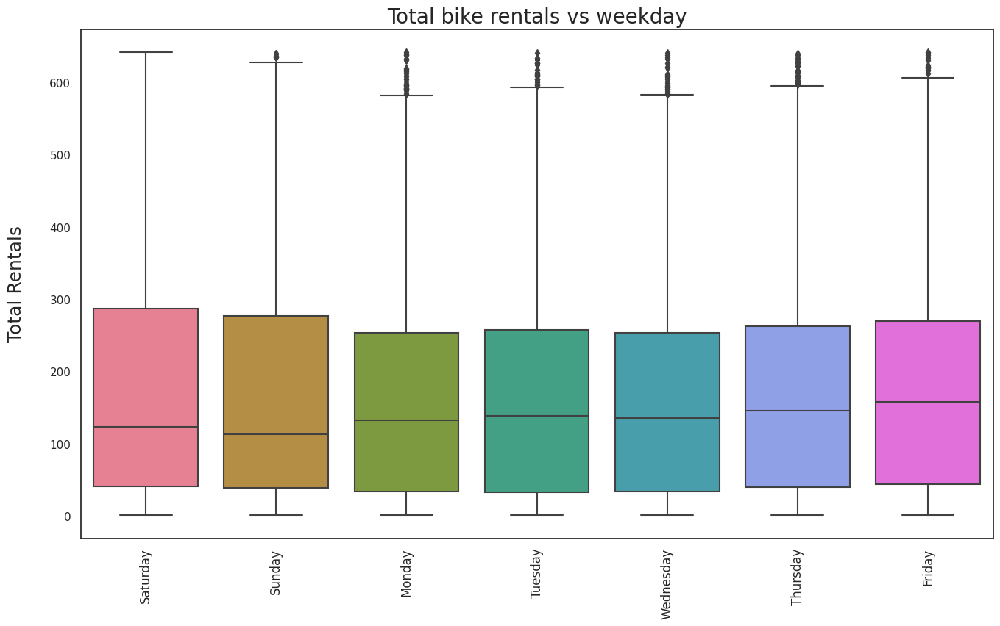

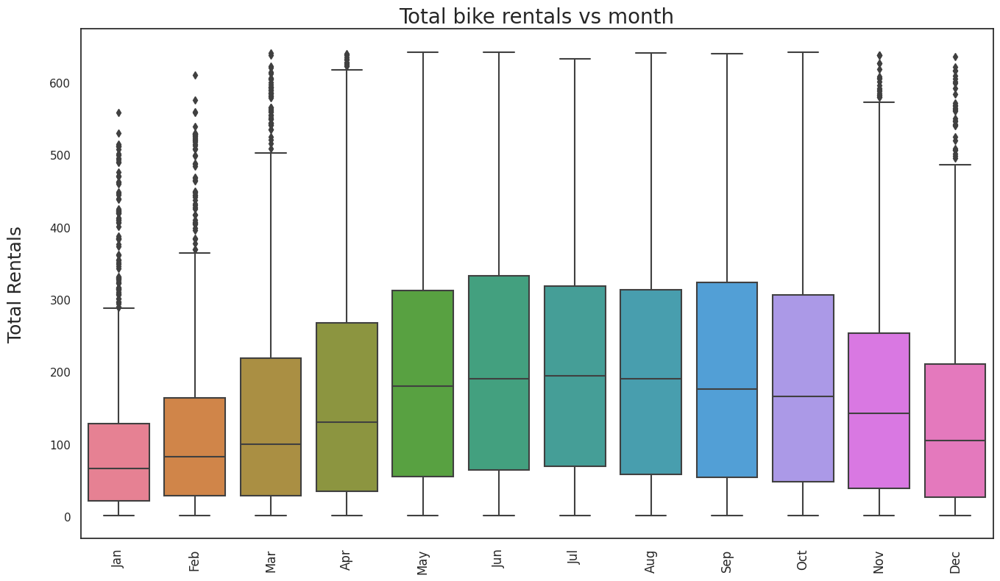

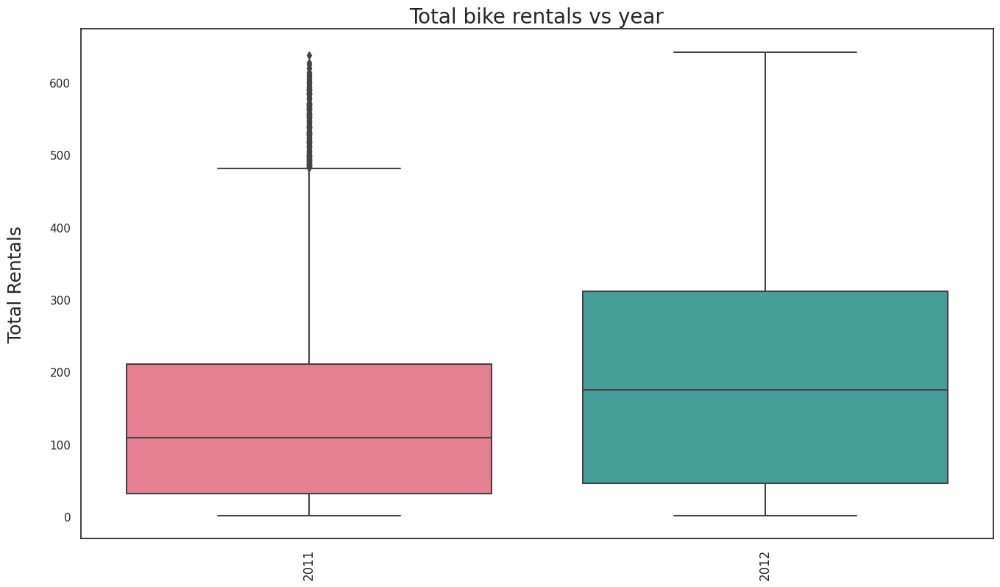

In [47]:
# Box plot
for feat in features:
    plt.figure(figsize=(16, 9))
    ax = sns.boxplot(x=feat, y='total_rentals', data=df_hour, palette='husl')
    plt.title(f'Total bike rentals vs {feat}', fontsize=20)
    plt.xticks(rotation=90, fontsize=12)
    plt.xlabel('')
    plt.ylabel('Total Rentals\n', fontsize=18)
    plt.show()

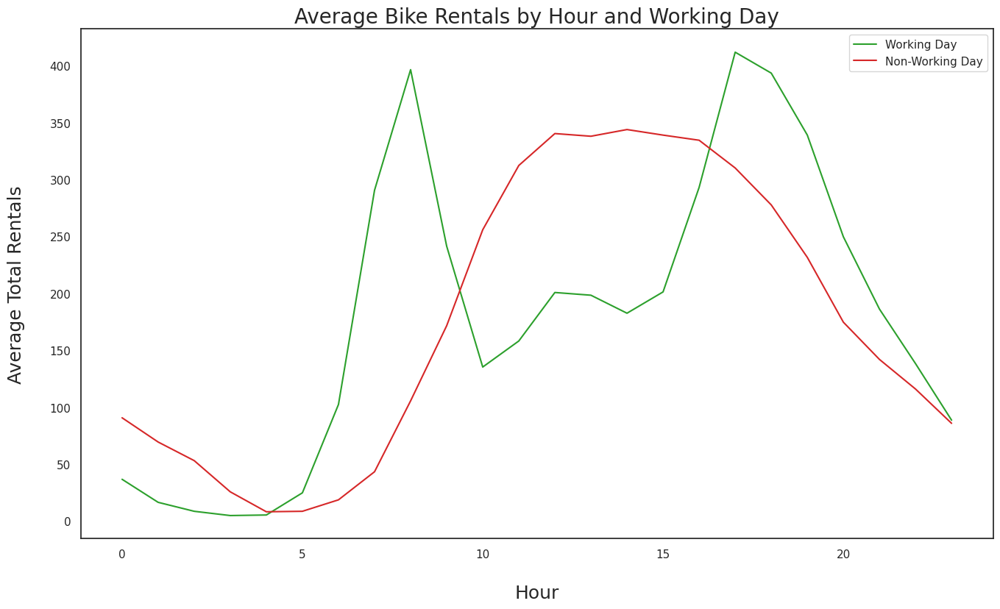

In [48]:
# Line plot by 'workingday'
# Group data by hour and workingday, then calculate average total_rentals
grouped = df_hour.groupby(['hour', 'workingday'])['total_rentals'].mean().reset_index()

# Create a single plot with subplots for working and non-working days
plt.figure(figsize=(16, 9))

# Plot for working days
working_day_data = grouped[grouped['workingday'] == 'Yes']
plt.plot(working_day_data['hour'],
         working_day_data['total_rentals'],
         label='Working Day',
         color='tab:green')

# Plot for non-working days
non_working_day_data = grouped[grouped['workingday'] == 'No']
plt.plot(non_working_day_data['hour'],
         non_working_day_data['total_rentals'],
         label='Non-Working Day',
         color='tab:red')

plt.legend()
plt.title('Average Bike Rentals by Hour and Working Day', fontsize=20)
plt.xlabel('\nHour', fontsize=18)
plt.ylabel('Average Total Rentals\n', fontsize=18)
plt.show()

In [49]:
working_day_data[working_day_data['total_rentals'] > 395].reset_index(drop=True)

,hour,workingday,total_rentals
0,8,Yes,396.501355
1,17,Yes,411.847458


In [50]:
non_working_day_data[non_working_day_data['total_rentals'] > 338].reset_index(drop=True)

,hour,workingday,total_rentals
0,12,No,340.387850
1,13,No,338.033654
2,14,No,343.907834
3,15,No,339.032110


**Hasil Observasi**

- Pada hari kerja, rerata jumlah rental sepeda yang tertinggi pada pukul 8.00 pagi (397) dan 17.00 sore (412), yaitu masing-masing terjadi pada waktu berangkat dan pulang kerja.
- Pada hari libur, puncak rental sepeda terjadi pada pukul 12.00 hingga 15.00 siang (yaitu, lebih dari 338).

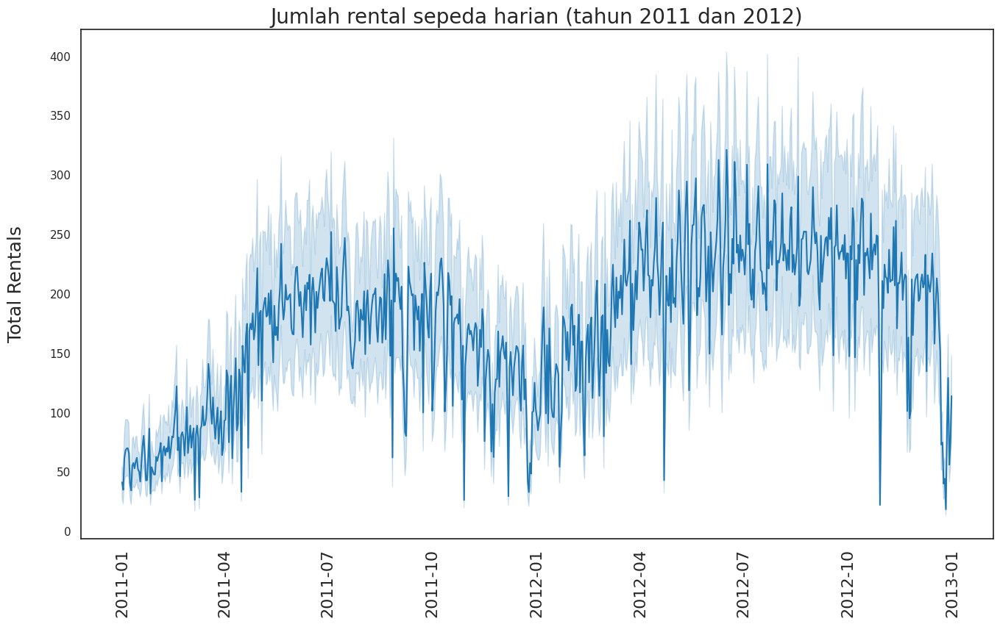

In [51]:
# Line plot of 'total_rentals' daily
plt.figure(figsize=(16, 9))
sns.lineplot(x='date', y='total_rentals', data=df_hour, color='tab:blue')
plt.title('Jumlah rental sepeda harian (tahun 2011 dan 2012)', fontsize=20)
plt.xticks(rotation=90, fontsize=16)
plt.xlabel('')
plt.ylabel('Total Rentals\n', fontsize=18)
plt.show()

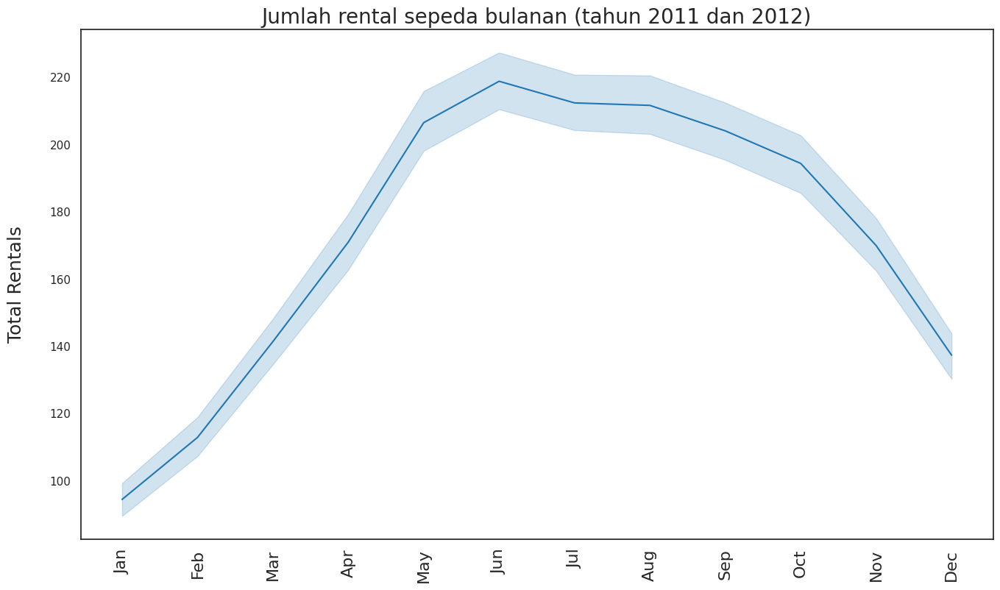

In [52]:
# Line plot of 'total_rentals' monthly
plt.figure(figsize=(16, 9))
sns.lineplot(x='month', y='total_rentals', data=df_hour, color='tab:blue')
plt.title('Jumlah rental sepeda bulanan (tahun 2011 dan 2012)', fontsize=20)
plt.xticks(rotation=90, fontsize=16)
plt.xlabel('')
plt.ylabel('Total Rentals\n', fontsize=18)
plt.show()

In [53]:
# Calculate the peak total rentals
peak_total_rentals = df_hour['total_rentals'].max()

# Find the month with the peak total rentals
peak_month = df_hour[df_hour['total_rentals'] == peak_total_rentals]['month'].values[2]

print(f'Puncak rental sepeda terjadi pada bulan {peak_month} sebanyak {peak_total_rentals}.')

Puncak rental sepeda terjadi pada bulan Jun sebanyak 642.


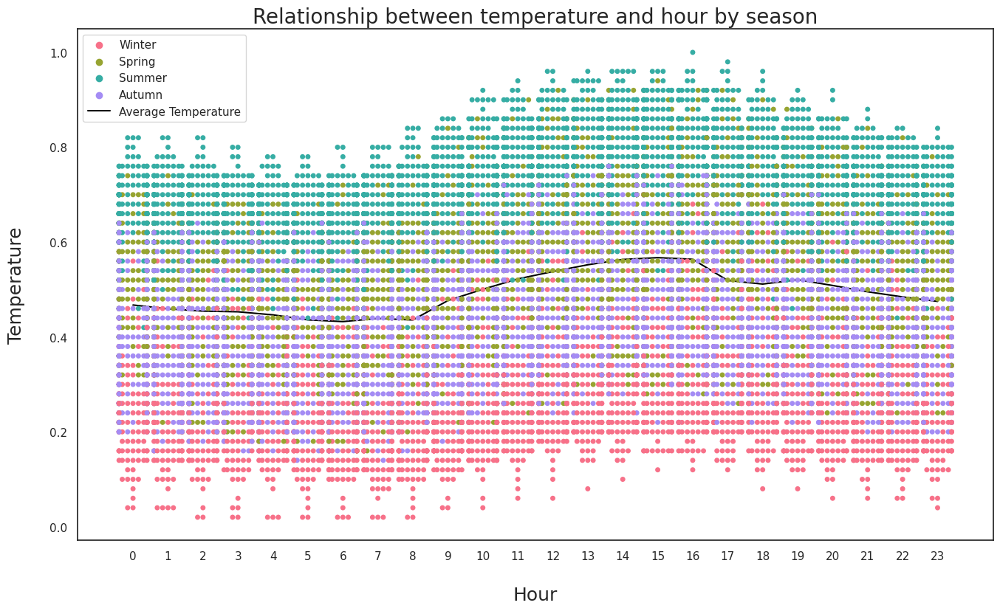

In [54]:
fig, ax1 = plt.subplots(figsize=(16, 9))

# Create a swarm plot
sns.swarmplot(x='hour',
              y='temperature',
              data=df_hour,
              hue='season',
              palette='husl',
              ax=ax1)

# Add a lineplot to the same axis
average_temperature_by_hour = df_hour.groupby('hour')['temperature'].mean()
ax1.plot(average_temperature_by_hour.index, average_temperature_by_hour.values, color='black', label='Average Temperature')

plt.title('Relationship between temperature and hour by season', fontsize=20)
plt.xlabel('\nHour', fontsize=18)
plt.ylabel('Temperature\n', fontsize=18)
plt.legend(loc='upper left')
plt.show()

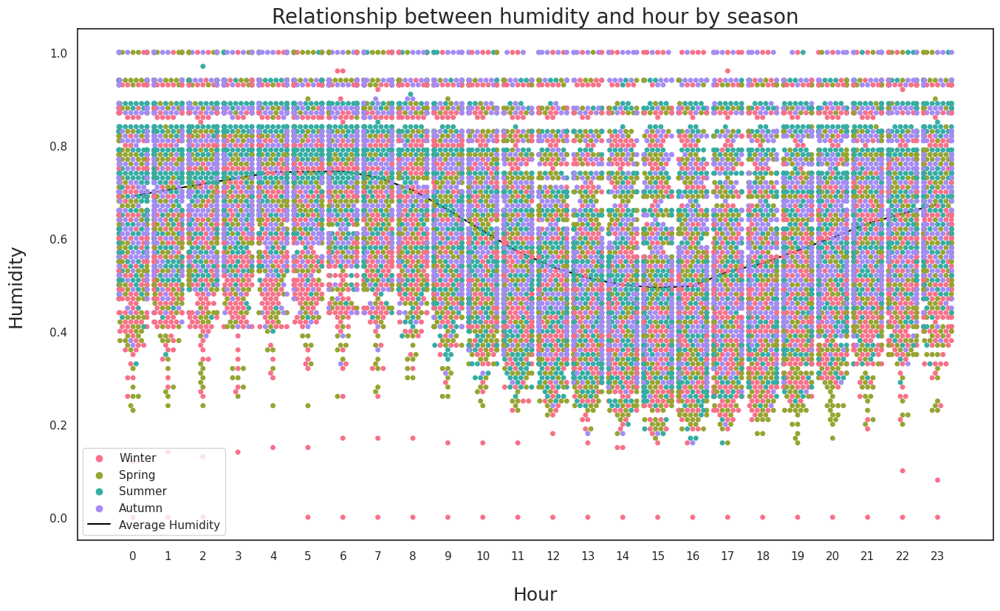

In [55]:
fig, ax2 = plt.subplots(figsize=(16, 9))

# Create a swarm plot
sns.swarmplot(x='hour',
              y='humidity',
              data=df_hour,
              hue='season',
              palette='husl',
              ax=ax2)

# Add a lineplot to the same axis
average_humidity_by_hour = df_hour.groupby('hour')['humidity'].mean()
ax2.plot(average_humidity_by_hour.index, average_humidity_by_hour.values, color='black', label='Average Humidity')

plt.title('Relationship between humidity and hour by season', fontsize=20)
plt.xlabel('\nHour', fontsize=18)
plt.ylabel('Humidity\n', fontsize=18)
plt.legend(loc='lower left')
plt.show()

In [56]:
cat_var = ['season', 'weather_situation', 'weekday', 'holiday', 'workingday']

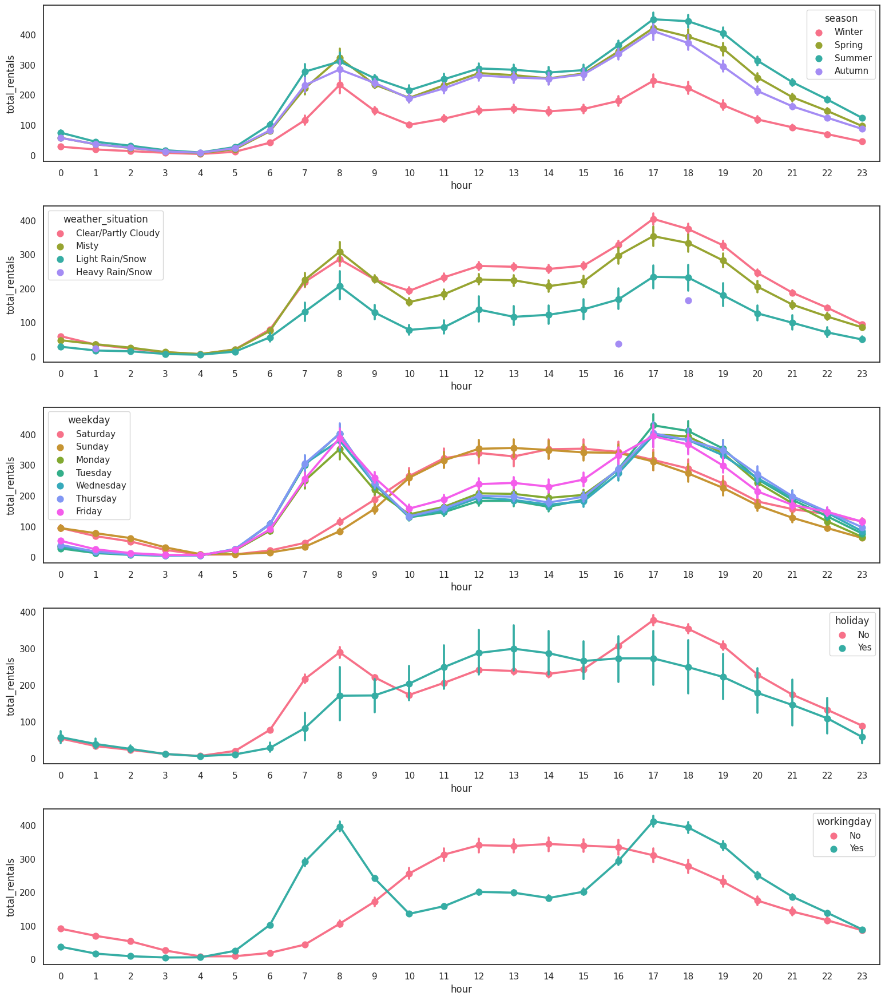

In [57]:
# Create a figure with 5x1 subplots
mpl.rc('font', size=16)
figure, axes = plt.subplots(nrows=5)
figure.set_size_inches(16, 18)
plt.tight_layout(pad=2)

for i, label in enumerate(cat_var):
    sns.pointplot(x='hour',
                  y='total_rentals',
                  data=df_hour,
                  hue=label,
                  palette='husl',
                  ax=axes[i])

**Hasil Observasi**

- Jumlah rental sepeda yang tertinggi terjadi pada musim panas, `Summer`, dan yang terendah terjadi pada musim dingin, `Winter`.
- Pada kondisi cuaca cerah, `Clear`, jumlah rental sepeda lebih tinggi dibandingkan kodisi yang lain.
- Pada `workingday` (hari Senin hingga Jumat), rerata jumlah rental sepeda yang tertinggi pada pukul 8.00 pagi dan 17.00 sore.
- Pada `holiday` ataupun *weekend* (hari Sabtu dan Minggu), puncak rental sepeda terjadi pada pukul 12.00 hingga 15.00 siang.

### Jawaban dari Pertanyaan 2: Bagaimanakah pengaruh temperatur dan kelembapan terhadap jumlah rental sepeda?

In [58]:
num_var = ['temperature', 'feels_like_temperature', 'humidity', 'wind_speed']

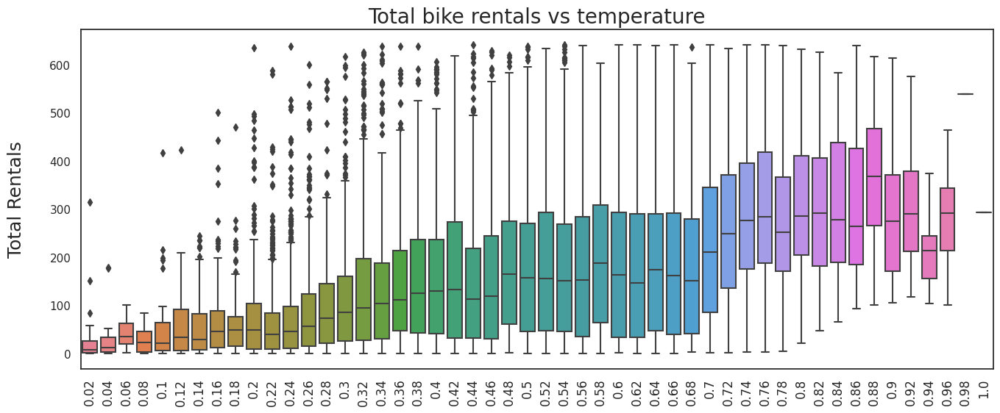

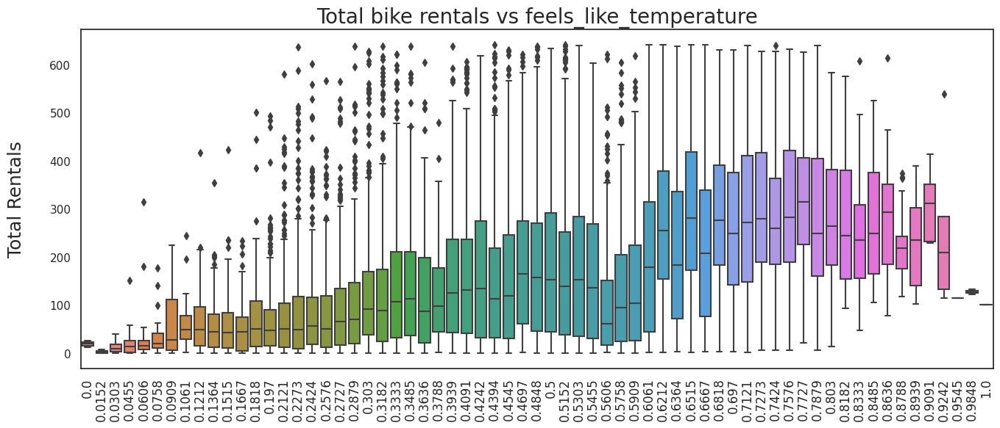

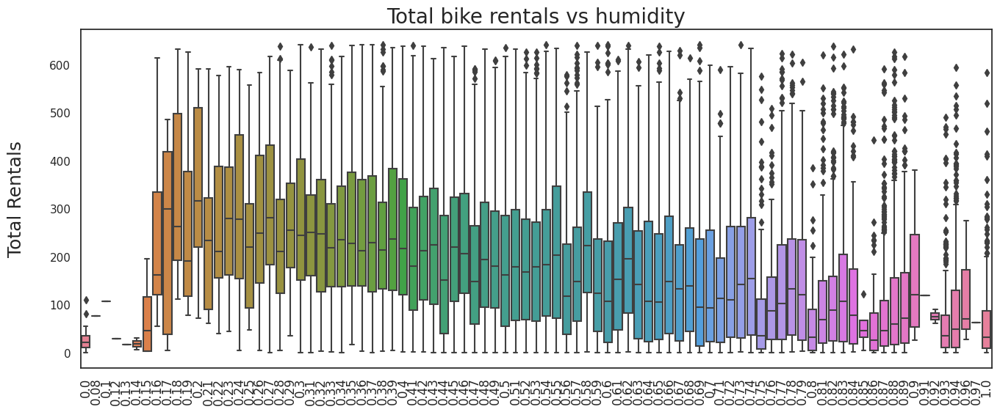

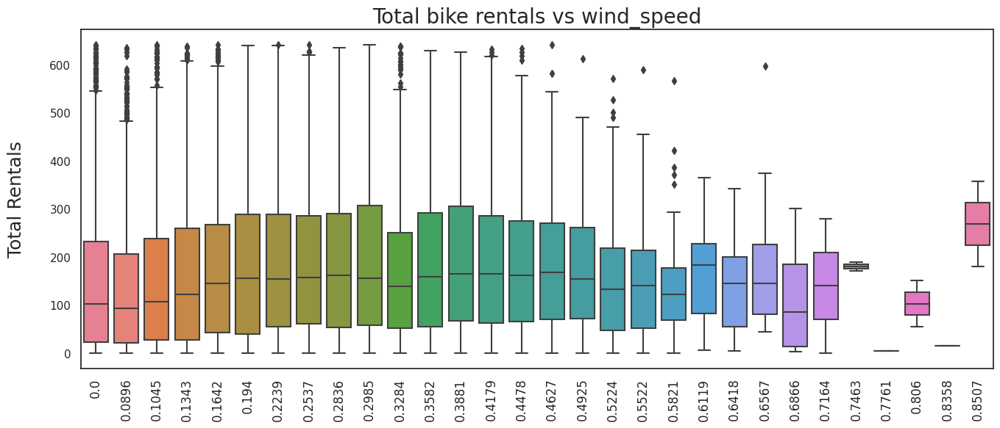

In [59]:
# Box plot vs 'total_rentals'
for var in num_var:
    plt.figure(figsize=(16, 6))
    ax = sns.boxplot(x=var, y='total_rentals', data=df_hour, palette='husl')
    plt.title(f'Total bike rentals vs {var}', fontsize=20)
    plt.xticks(rotation=90, fontsize=12)
    plt.xlabel('')
    plt.ylabel('Total Rentals\n', fontsize=18)
    plt.show()

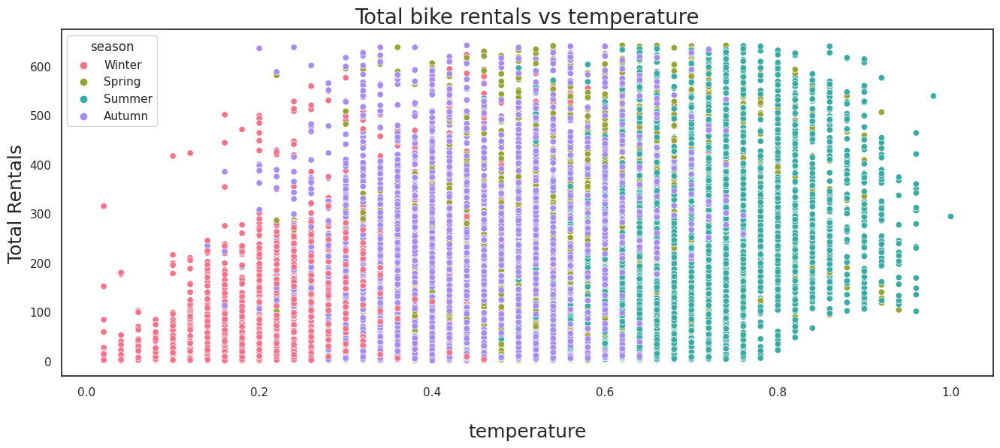

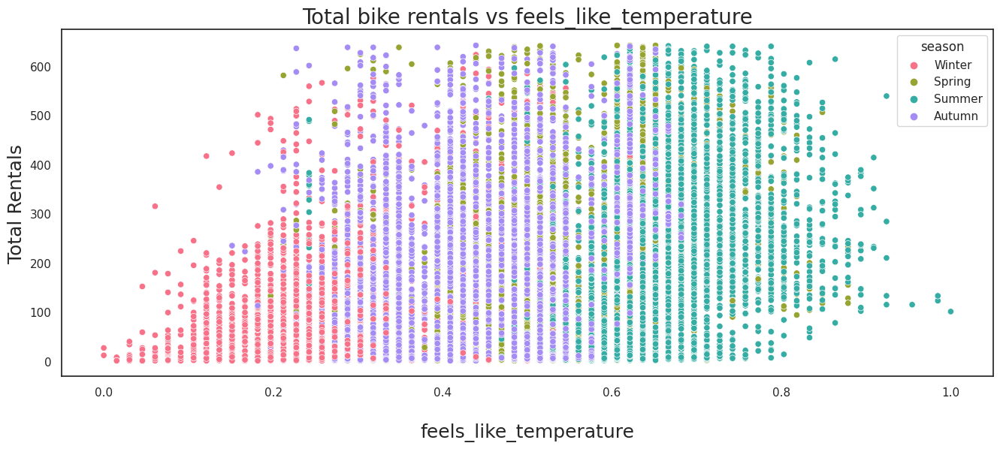

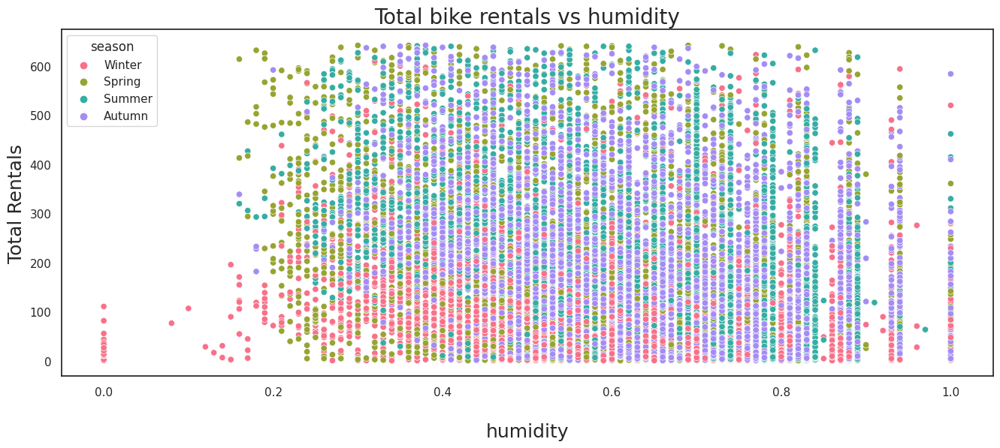

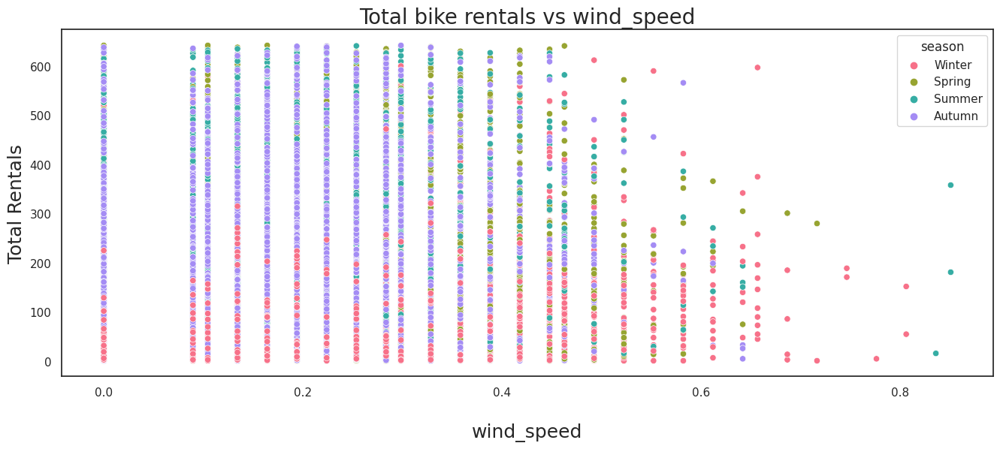

In [60]:
# Scatter plot by 'season'
for var in num_var:
    plt.figure(figsize=(16, 6))
    sns.scatterplot(
        x=var,
        y='total_rentals',
        data=df_hour,
        hue='season',
        palette='husl'
    )
    plt.title('Total bike rentals vs {}'.format(var), fontsize=20)
    plt.xlabel('\n{}'.format(var), fontsize=18)
    plt.ylabel('Total Rentals', fontsize=18)
    plt.show()

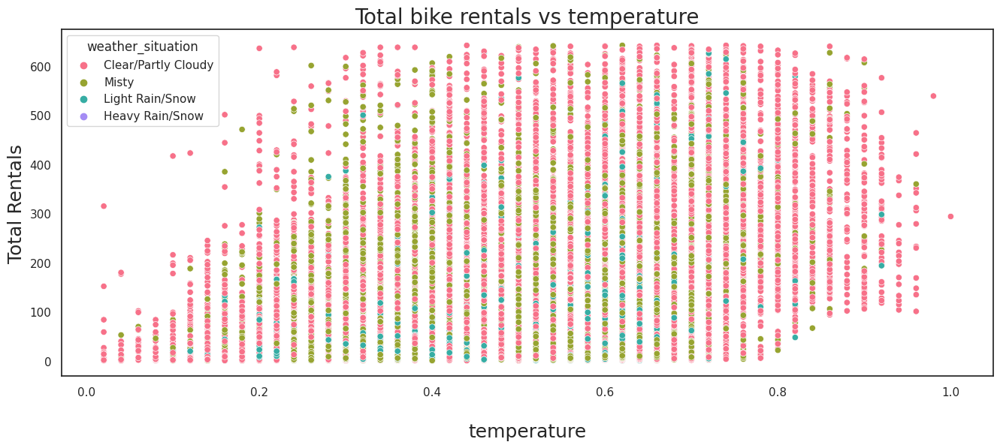

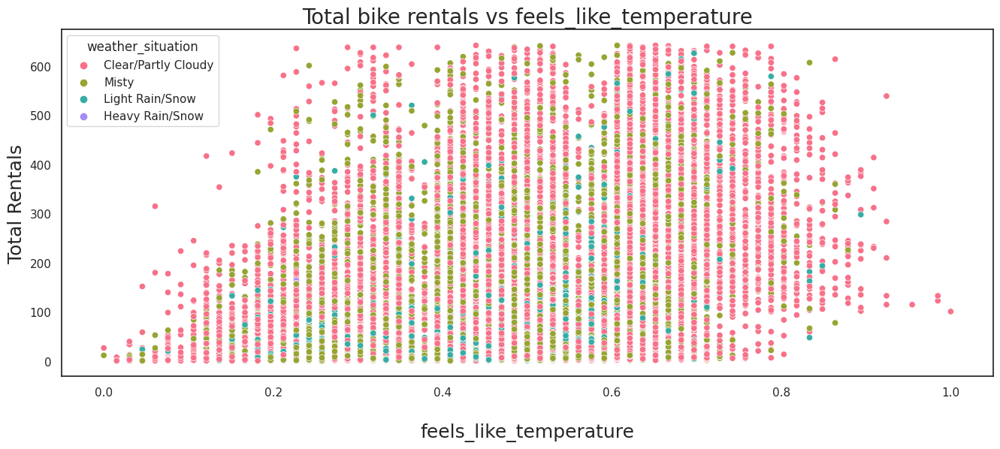

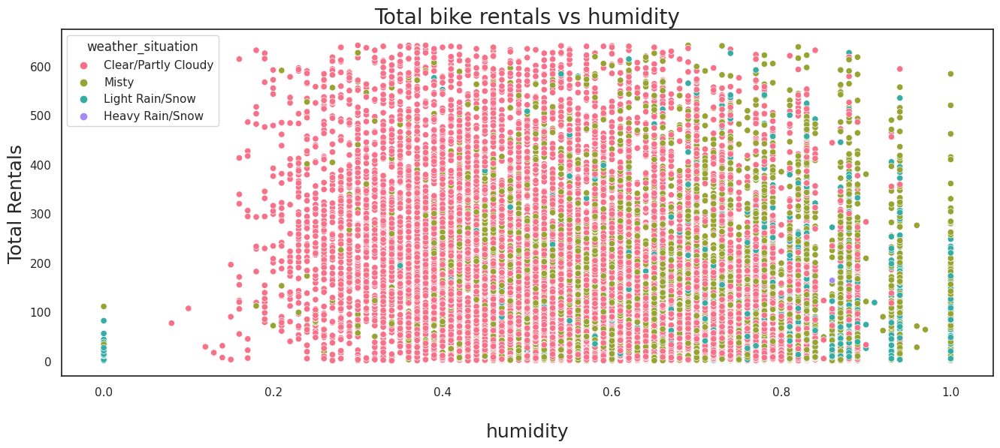

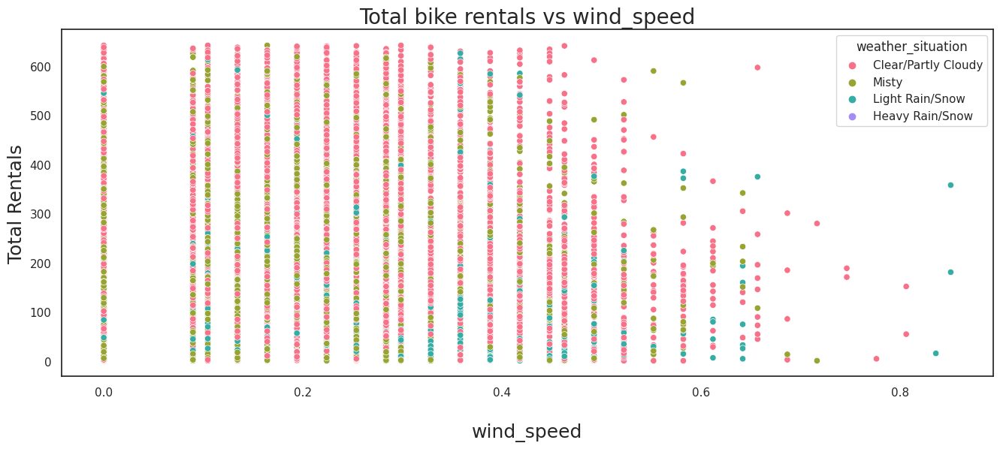

In [61]:
# Scatter plot by 'weather_situation'
for var in num_var:
    plt.figure(figsize=(16, 6))
    sns.scatterplot(
        x=var,
        y='total_rentals',
        data=df_hour,
        hue='weather_situation',
        palette='husl'
    )
    plt.title('Total bike rentals vs {}'.format(var), fontsize=20)
    plt.xlabel('\n{}'.format(var), fontsize=18)
    plt.ylabel('Total Rentals', fontsize=18)
    plt.show()

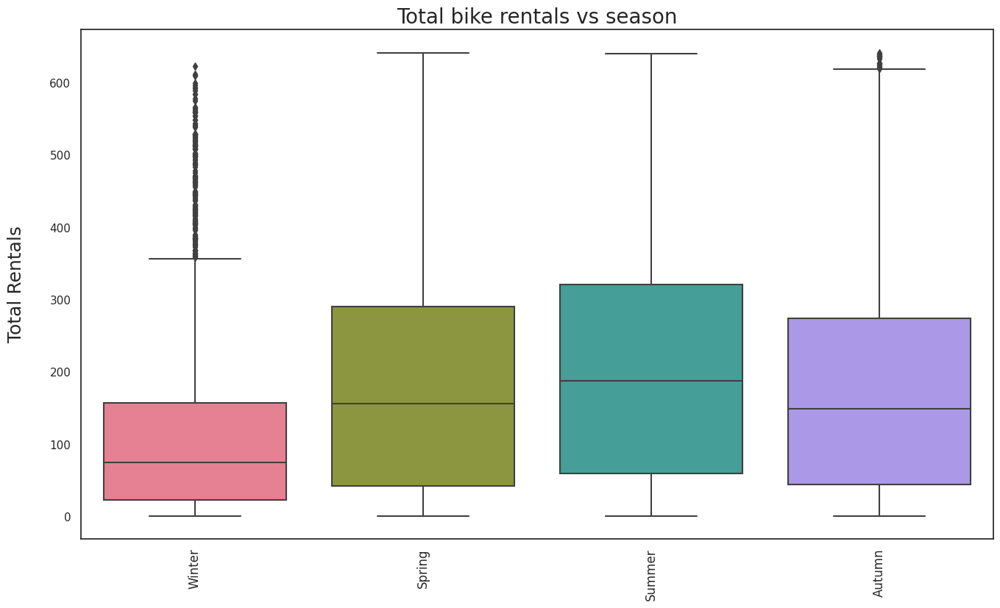

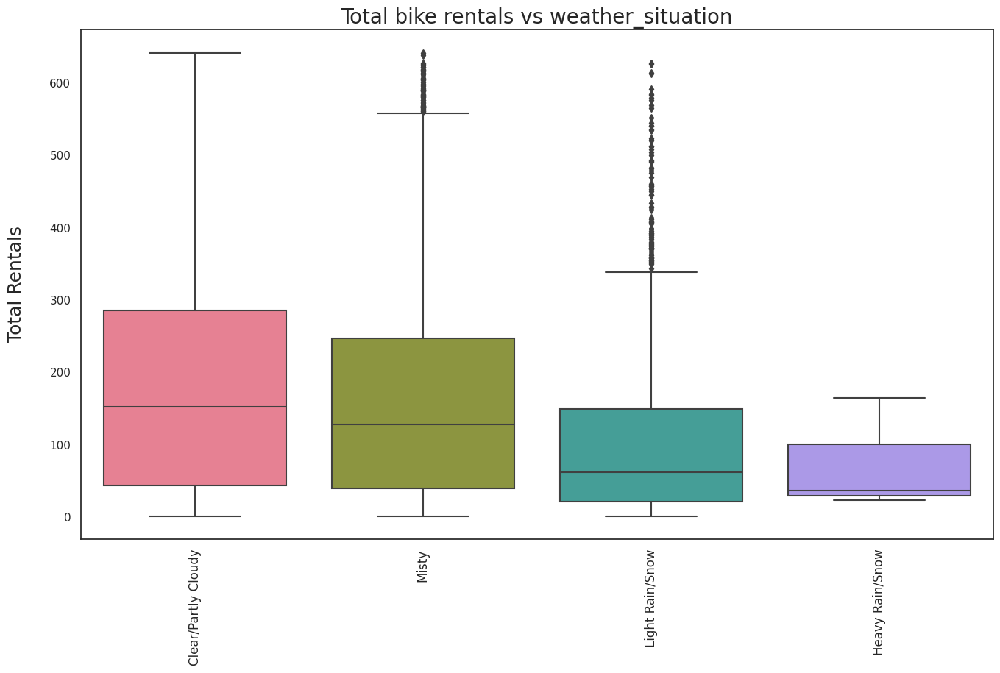

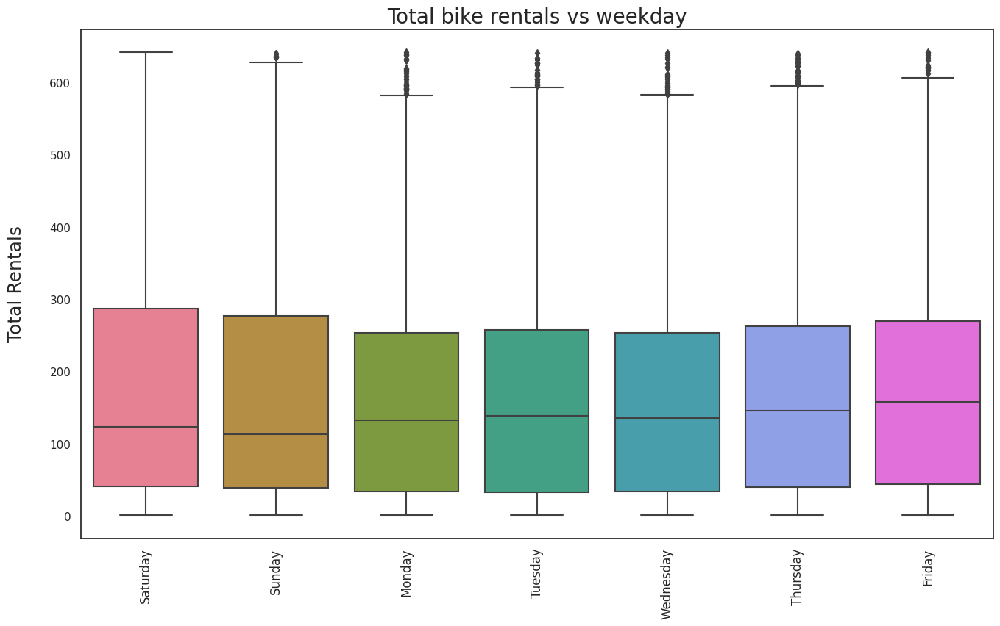

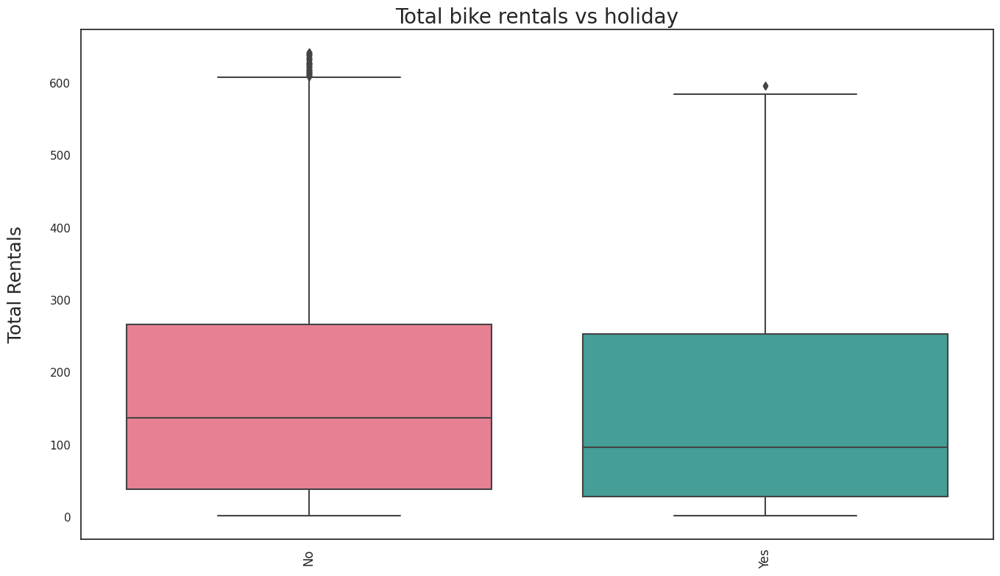

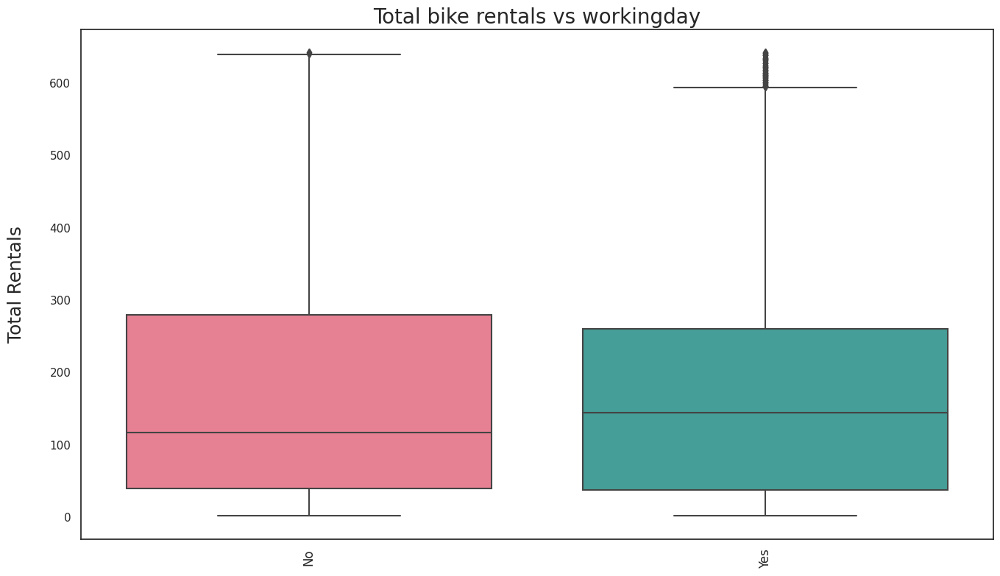

In [62]:
# Box plot
for var in cat_var:
    plt.figure(figsize=(16, 9))
    ax = sns.boxplot(x=var, y='total_rentals', data=df_hour, palette='husl')
    plt.title(f'Total bike rentals vs {var}', fontsize=20)
    plt.xticks(rotation=90, fontsize=12)
    plt.xlabel('')
    plt.ylabel('Total Rentals\n', fontsize=18)
    plt.show()

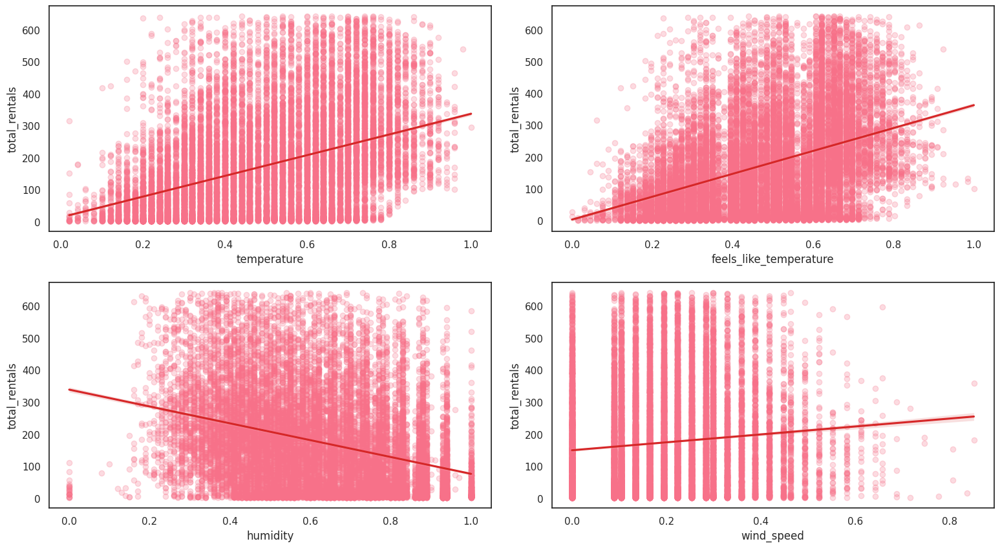

In [63]:
# Create a figure with 2x2 subplots
mpl.rc('font', size=16)
figure, axes = plt.subplots(nrows=2, ncols=2)
figure.set_size_inches(16, 9)
plt.tight_layout(pad=2)

for i, var in enumerate(num_var):
    row = i // 2
    col = i % 2
    sns.regplot(x=var,
                y='total_rentals',
                data=df_hour,
                ax=axes[row, col],
                scatter_kws={'alpha': 0.25},
                line_kws={'color': 'tab:red'})

## Conclusion

Berdasarkan analisis yang telah dilakukan, dapat disimpulkan bahwa

- Adanya pola rental sepeda yang berubah seiring waktu, yaitu musim panas adalah musim dengan jumlah rental sepeda tertinggi, cuaca cerah juga meningkatkan jumlah rental sepeda, dan waktu yang paling populer untuk rental sepeda adalah pagi dan sore pada hari kerja, serta siang hari pada hari libur ataupun akhir pekan.
- Adanya pengaruh temperatur dan kelembapan terhadap jumlah rental sepeda, yaitu jika temperatur luar ruangan (*outdoor*) cukup hangat dan kelembapan cukup rendah, jumlah rental sepeda cenderung meningkat.